# Python Image processing

Developer: Jancarlo Rojas


In [5]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import cv2 

In [7]:
# listing files
import os
input("Available images:")
for dirname, _, filenames in os.walk('img'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

Available images: 


img\aero1.jpg
img\aero3.jpg
img\aloeGT.png
img\aloeL.jpg
img\aloeR.jpg
img\apple.jpg
img\baboon.jpg
img\Background-Subtraction-Tutorial_merged.gif
img\Background_Subtraction_Tutorial_frame.png
img\Background_Subtraction_Tutorial_frame_1.png
img\basketball1.png
img\basketball2.png
img\Blender_Suzanne1.jpg
img\Blender_Suzanne2.jpg
img\blobs.jpg
img\blox.jpg
img\board.jpg
img\box.png
img\box_in_scene.png
img\building.jpg
img\butterfly.jpg
img\cards.png
img\chessboard.png
img\detect_blob.png
img\digits.png
img\ela_modified.jpg
img\ela_original.jpg
img\ellipses.jpg
img\fruits.jpg
img\gradient.png
img\graf1.png
img\hand.jpg
img\HappyFish.jpg
img\home.jpg
img\house.jpg
img\imageTextN.png
img\imageTextR.png
img\left.jpg
img\left01.jpg
img\left02.jpg
img\left03.jpg
img\left04.jpg
img\lena.jpg
img\lena_tmpl.jpg
img\licenseplate_motion.jpg
img\LinuxLogo.jpg
img\mask.png
img\messi5.jpg
img\minions.jpg
img\ml.png
img\notes.png
img\opencv-logo-white.png
img\opencv-logo.png
img\orange.jpg
img\Origin_

In [8]:
# now list video files
print("Available videos:")
for dirname, _, filenames in os.walk('vids'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

Available videos:
vids\Background-Subtraction-Tutorial_merged.mp4
vids\Background_Subtraction_Tutorial_frame.mp4


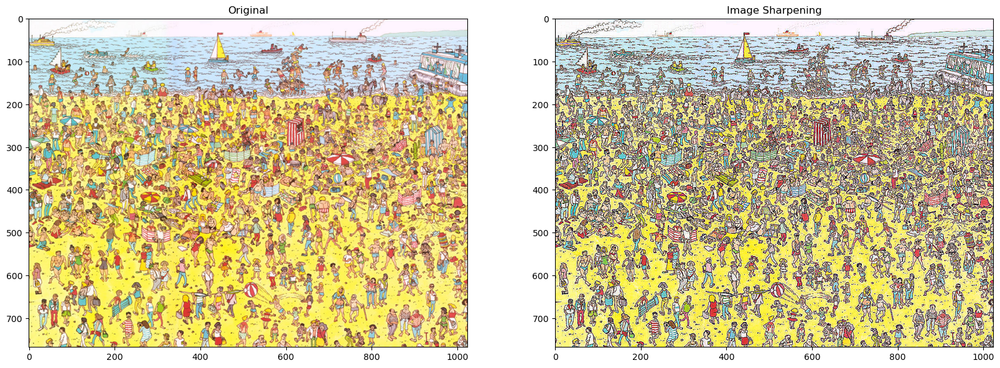

In [11]:
# Sharpening Images
image = cv2.imread('img/waldoBeach.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)


plt.figure(figsize=(20, 20))
plt.subplot(1, 2, 1) 
plt.title("Original")
plt.imshow(image)



# Define sharpening kernel (3x3 matrix) with values that emphasize edges.
# filter2D function applies this to image to perform sharpening operation.
kernel_sharpening = np.array([[-1, -1, -1],
                              [-1, 9, -1],
                              [-1, -1, -1]])


sharpened = cv2.filter2D(image, -1, kernel_sharpening)

plt.subplot(1, 2, 2)
plt.title("Image Sharpening")
plt.imshow(sharpened)

plt.show()


# Thresholding Images

- Simplest method of segmenting images. That is, divide an image into groups of pixels based upon specific criteria.
- Thresholding is used to create binary images.
- From a given image, thresholding can be used to create binary images.
- Example: Replace each pixel in an image with a black or white pixel, based upon image intensity thresholds.
- Replace each pixel in image with black pixel, if image intensity is less than a fixed value (i.e., "threshold")
- Replace each pixel in image with white pixel, if image intensity is greater than a fixed value.

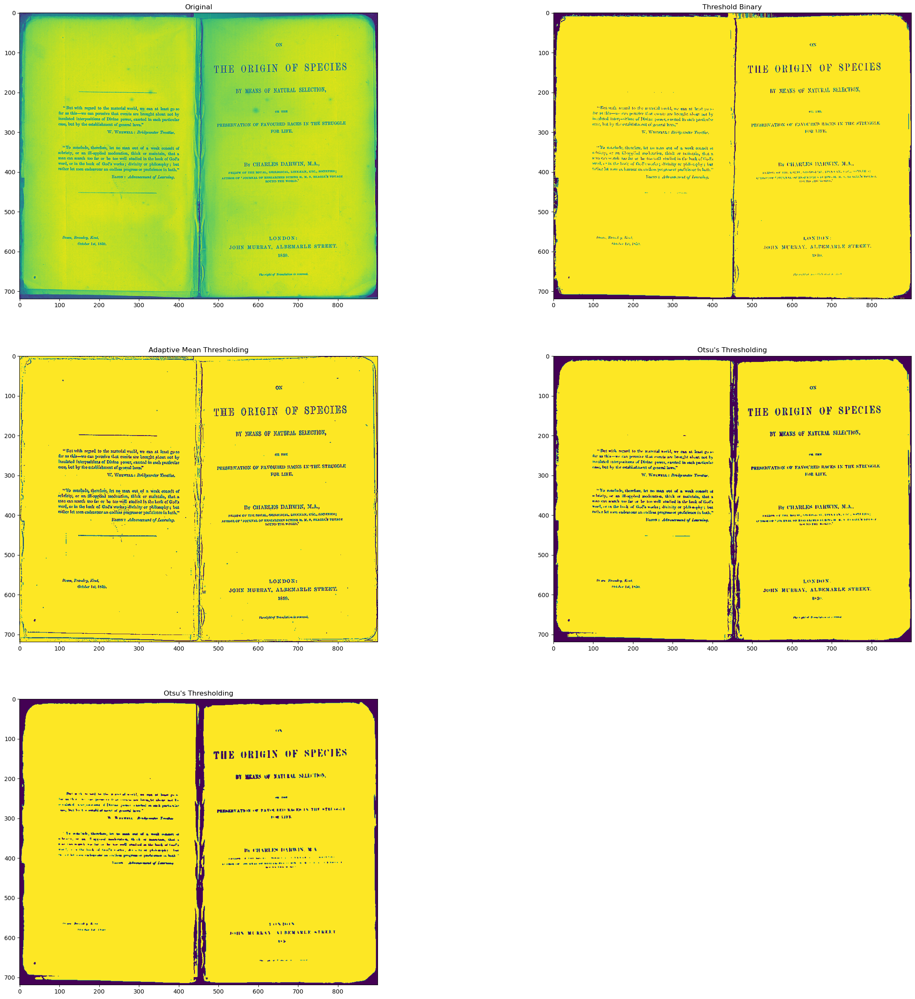

In [15]:
image = cv2.imread('img/Origin_of_Species.jpg', 0)
plt.figure(figsize=(30, 30))

plt.subplot(3, 2, 1)
plt.title("Original")
plt.imshow(image)

ret, thresh1 = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)
plt.subplot(3, 2, 2)
plt.title("Threshold Binary")
plt.imshow(thresh1)

image = cv2.GaussianBlur(image, (3, 3), 0)
thresh = cv2.adaptiveThreshold(image, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 3, 5)
plt.subplot(3, 2, 3)
plt.title("Adaptive Mean Thresholding")
plt.imshow(thresh)

ret, th2 = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
plt.subplot(3, 2, 4)
plt.title("Otsu's Thresholding")
plt.imshow(th2)

plt.subplot(3, 2, 5)
plt.title("Otsu's Thresholding")
blur = cv2.GaussianBlur(image, (5, 5), 0)
ret, th3 = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
plt.imshow(th3)

plt.show()

# Edge Detection

- Used to identify boundaries (edges) of objects, or regions within an image.
- Edges are very important features in images.
- The underlying structure of an image can be determined through its edges.

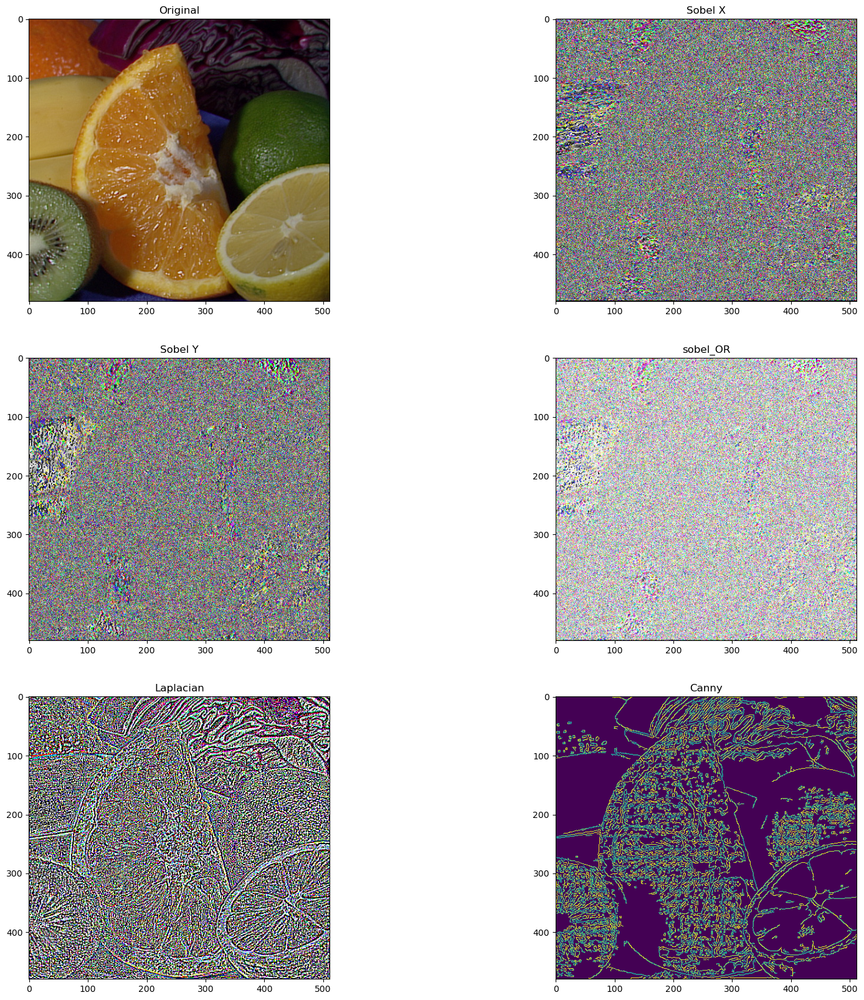

In [16]:
image = cv2.imread('img/fruits.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

image = image.astype('uint8')

height, width,_ = image.shape

sobel_x = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=5)
sobel_y = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=5)

sobel_x = sobel_x.astype('uint8')
sobel_y = sobel_y.astype('uint8')

plt.figure(figsize=(20, 20))

plt.subplot(3, 2, 1)
plt.title("Original")
plt.imshow(image)

plt.subplot(3, 2, 2)
plt.title("Sobel X")
plt.imshow(sobel_x)

plt.subplot(3, 2, 3)
plt.title("Sobel Y")
plt.imshow(sobel_y)

sobel_OR = cv2.bitwise_or(sobel_x, sobel_y)

plt.subplot(3, 2, 4)
plt.title("sobel_OR")
plt.imshow(sobel_OR)

laplacian = cv2.Laplacian(image, cv2.CV_64F)

laplacian = laplacian.astype('uint8')

plt.subplot(3, 2, 5)
plt.title("Laplacian")
plt.imshow(laplacian)

canny = cv2.Canny(image, 50, 120)

plt.subplot(3, 2, 6)
plt.title("Canny")
plt.imshow(canny)

## Edge detection - choosing thresholds

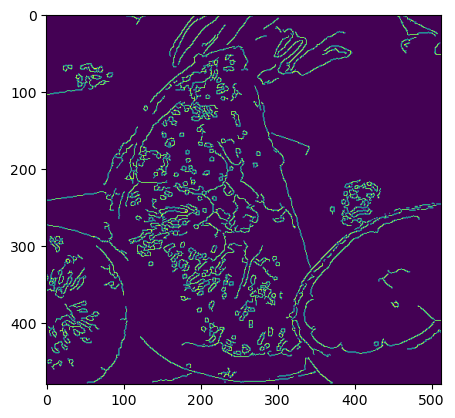

In [17]:
img = cv2.imread('img/fruits.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

med_val = np.median(img)

lower = int(max(0, 0.7 * med_val))

upper = int(min(255, 1.3 * med_val))

blurred_img = cv2.blur(img, ksize=(5,5))

edges = cv2.Canny(image=blurred_img, threshold1=lower, threshold2=upper+40)
plt.imshow(edges)

# Image Perspective Transform

- getPerspectiveTransform() function is needed.
- Transforms images according to the required change in viewpoint.

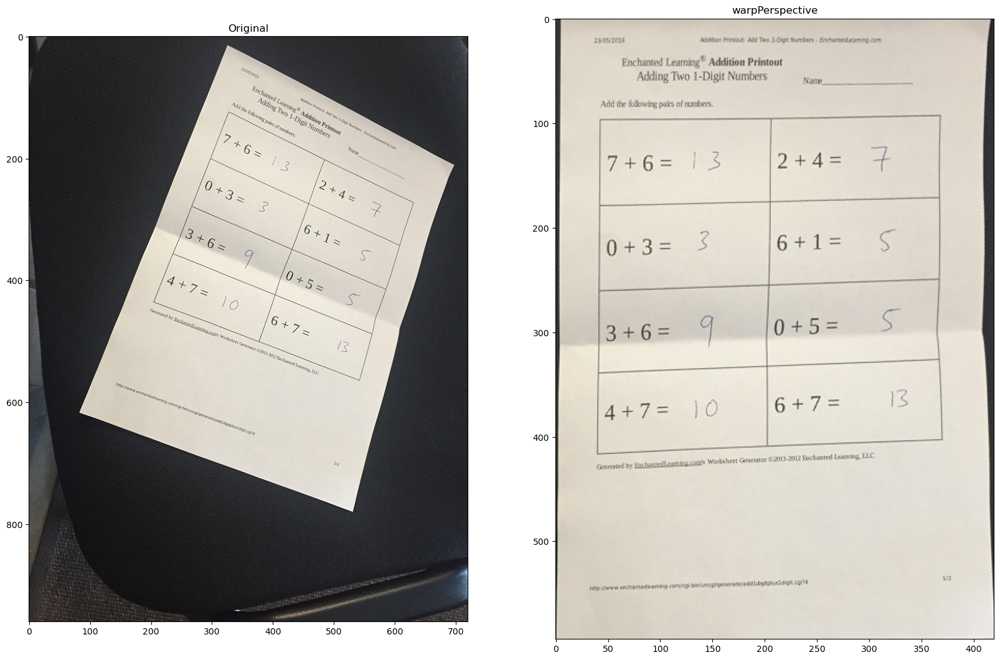

In [18]:
image = cv2.imread('img/scan.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20, 20))

plt.subplot(1, 2, 1)
plt.title("Original")
plt.imshow(image)

points_A = np.float32([[320,15], [700,215], [85,610], [530,780]])

points_B = np.float32([[0,0], [420,0], [0,594], [420,594]])

M = cv2.getPerspectiveTransform(points_A, points_B)

warped = cv2.warpPerspective(image, M, (420, 594))

plt.subplot(1, 2, 2)
plt.title("warpPerspective")
plt.imshow(warped)

## Blurring Images

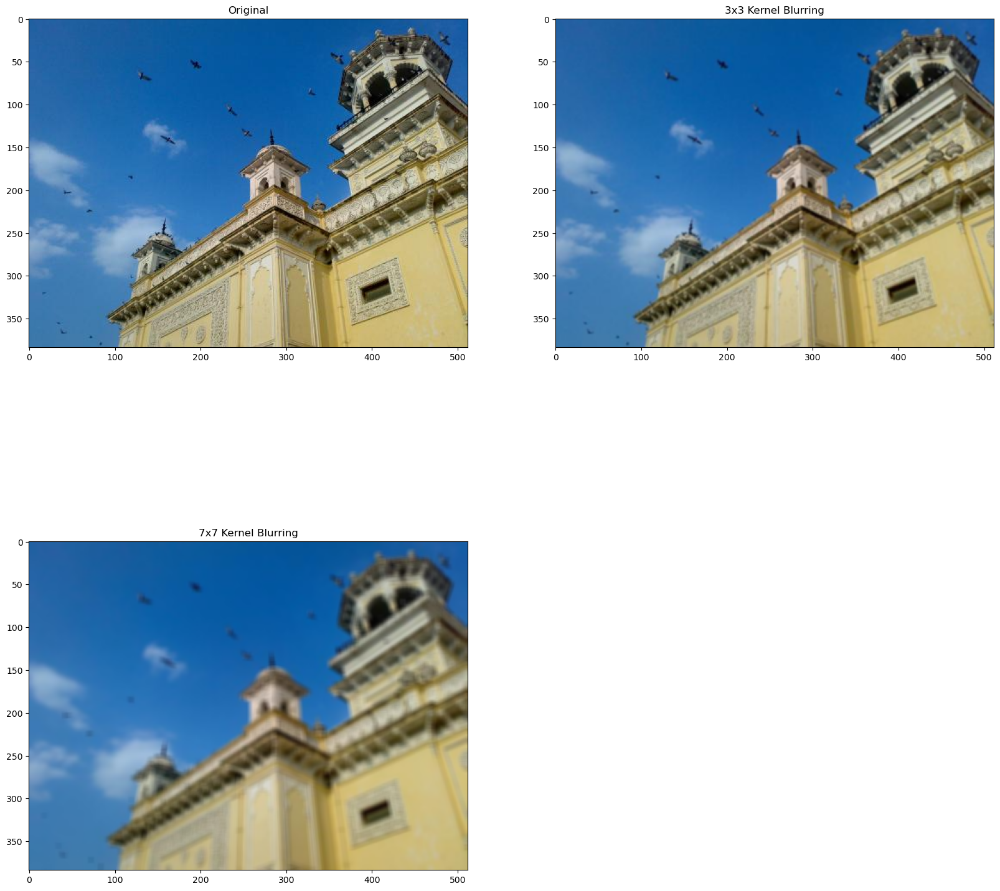

In [19]:
image = cv2.imread('img/home.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20, 20))

plt.subplot(2, 2, 1)
plt.title("Original")
plt.imshow(image)

kernel_3x3 = np.ones((3, 3), np.float32) / 9

blurred = cv2.filter2D(image, -1, kernel_3x3)

plt.subplot(2, 2, 2)
plt.title("3x3 Kernel Blurring")
plt.imshow(blurred)

kernel_7x7 = np.ones((7, 7), np.float32) / 49

blurred2 = cv2.filter2D(image, -1, kernel_7x7)

plt.subplot(2, 2, 3)
plt.title("7x7 Kernel Blurring")
plt.imshow(blurred2)

## Image Contours

Number of Contours found = 1


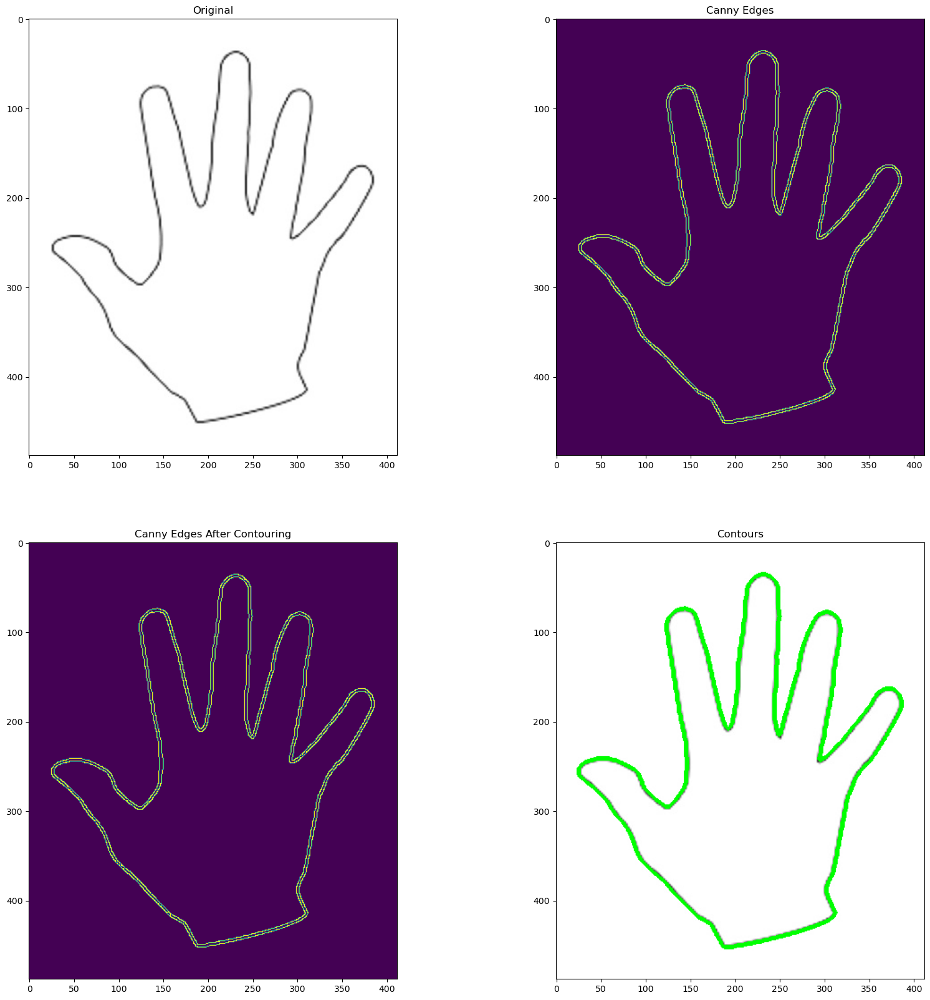

In [21]:
image = cv2.imread('img/hand.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20, 20))

plt.subplot(2, 2, 1)
plt.title("Original")
plt.imshow(image)

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

edged = cv2.Canny(gray, 30, 200)

plt.subplot(2, 2, 2)
plt.title("Canny Edges")
plt.imshow(edged)

contours, hierarchy = cv2.findContours(edged, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

plt.subplot(2, 2, 3)
plt.title("Canny Edges After Contouring")
plt.imshow(edged)

print("Number of Contours found = " + str(len(contours)))

cv2.drawContours(image, contours, -1, (0,255,0), 3)

plt.subplot(2, 2, 4)
plt.title("Contours")
plt.imshow(image)

plt.show()

## Approximating contours and convex hull

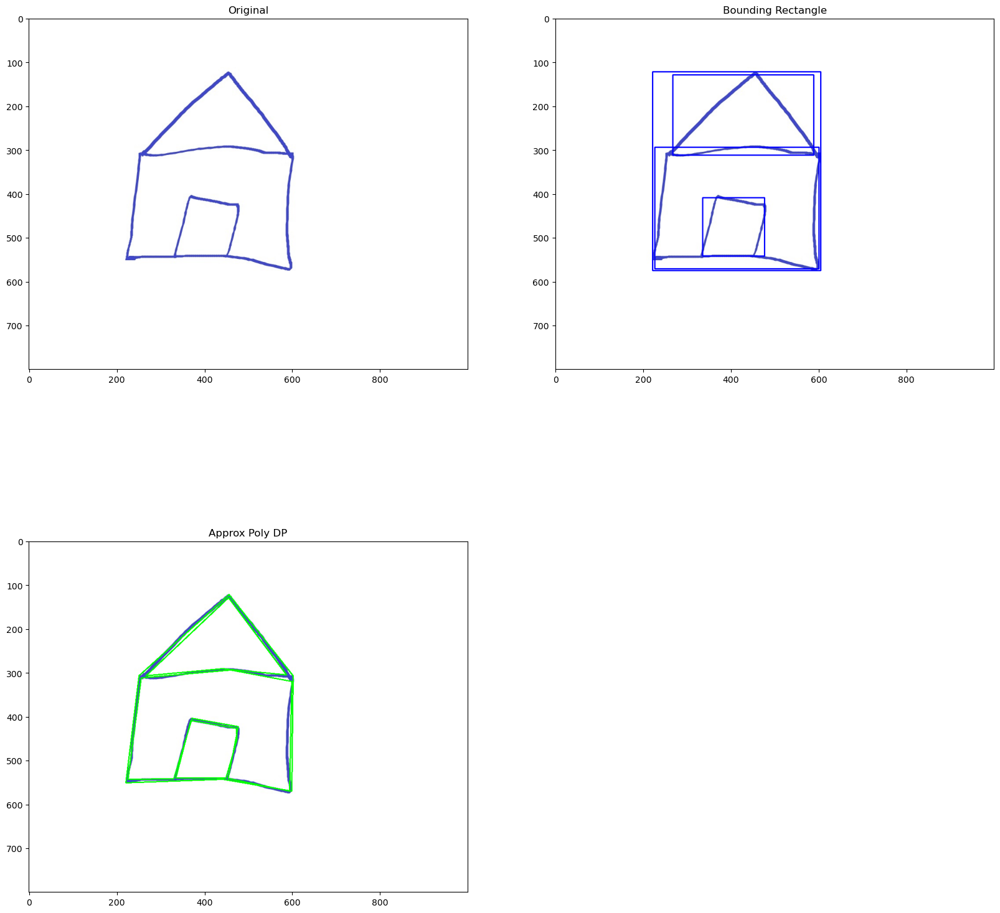

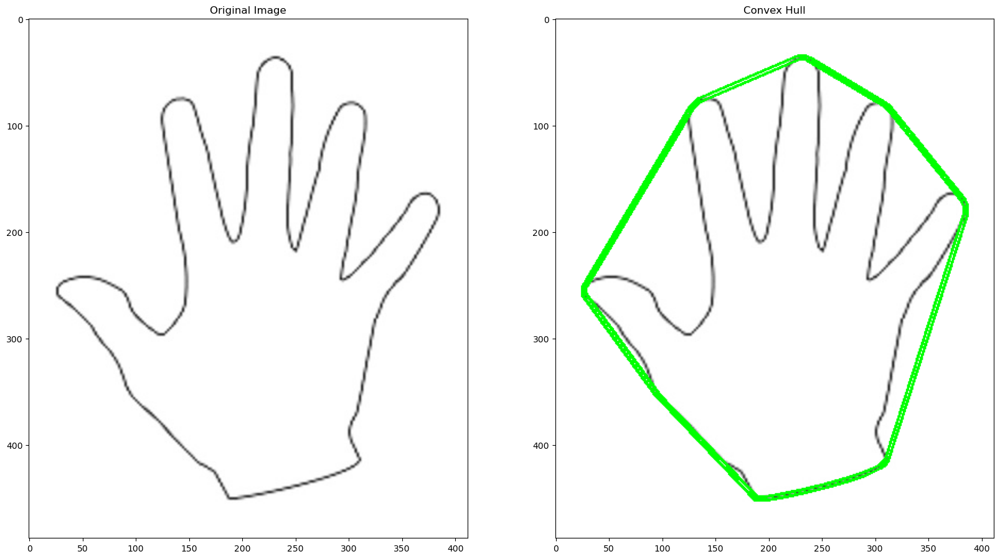

In [25]:
image = cv2.imread('img/house.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20, 20))

plt.subplot(2, 2, 1)
plt.title("Original")
plt.imshow(image)

orig_image = image.copy()

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

ret, thresh = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY_INV)

contours, hierarchy = cv2.findContours(thresh.copy(), cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)

for c in contours:
    x,y,w,h = cv2.boundingRect(c)
    cv2.rectangle(orig_image,(x,y),(x+w,y+h),(0,0,255),2)

plt.subplot(2, 2, 2)
plt.title("Bounding Rectangle")
plt.imshow(orig_image)

for c in contours:
    accuracy = 0.01 * cv2.arcLength(c, True)
    approx = cv2.approxPolyDP(c, accuracy, True)
    cv2.drawContours(image, [approx], 0, (0, 255, 0), 2)

plt.subplot(2, 2, 3)
plt.title("Approx Poly DP")
plt.imshow(image)

plt.show()

image = cv2.imread('img/hand.jpg')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(20, 20))

plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(image)

ret, thresh = cv2.threshold(gray, 176, 255, 0)

contours, hierarchy = cv2.findContours(thresh.copy(), cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)

n = len(contours) - 1
contours = sorted(contours, key=cv2.contourArea, reverse=False)[:n]

for c in contours:
    hull = cv2.convexHull(c)
    cv2.drawContours(image, [hull], 0, (0, 255, 0), 2)

plt.subplot(1, 2, 2)
plt.title("Convex Hull")
plt.imshow(image)

## Image Corners

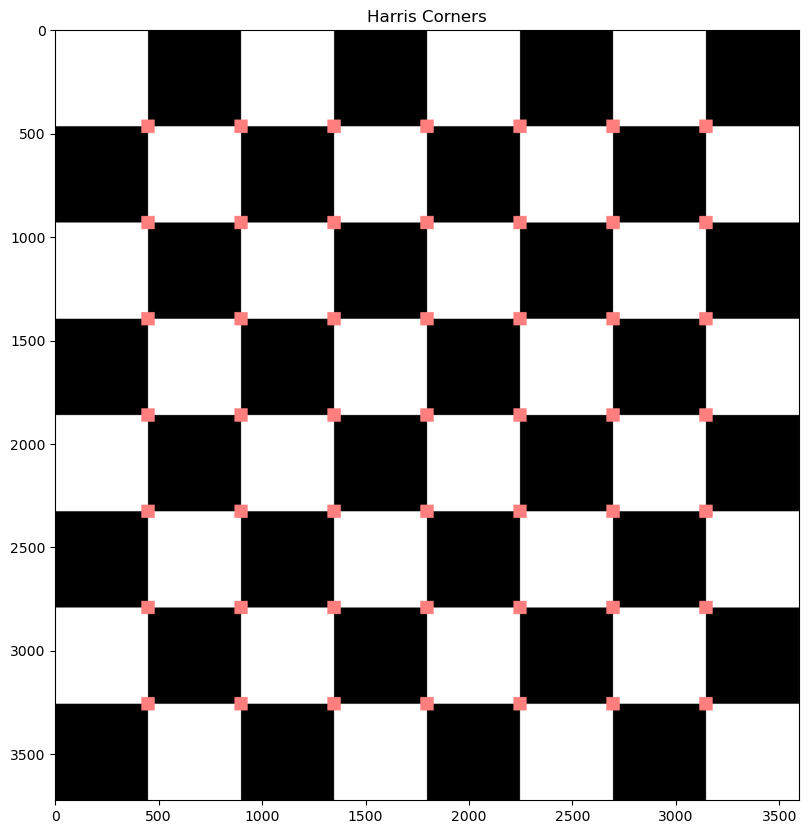

In [26]:
image = cv2.imread('img/chessboard.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 10))

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

gray = np.float32(gray)

harris_corners = cv2.cornerHarris(gray, 3, 3, 0.05)

kernel = np.ones((7,7), np.int8)
harris_corners = cv2.dilate(harris_corners, kernel, iterations = 10)

image[harris_corners > 0.025 * harris_corners.max()] = [255, 127, 127]

plt.subplot(1, 1, 1)
plt.title("Harris Corners")
plt.imshow(image)

## Image Background Subtraction - Motion Analysis

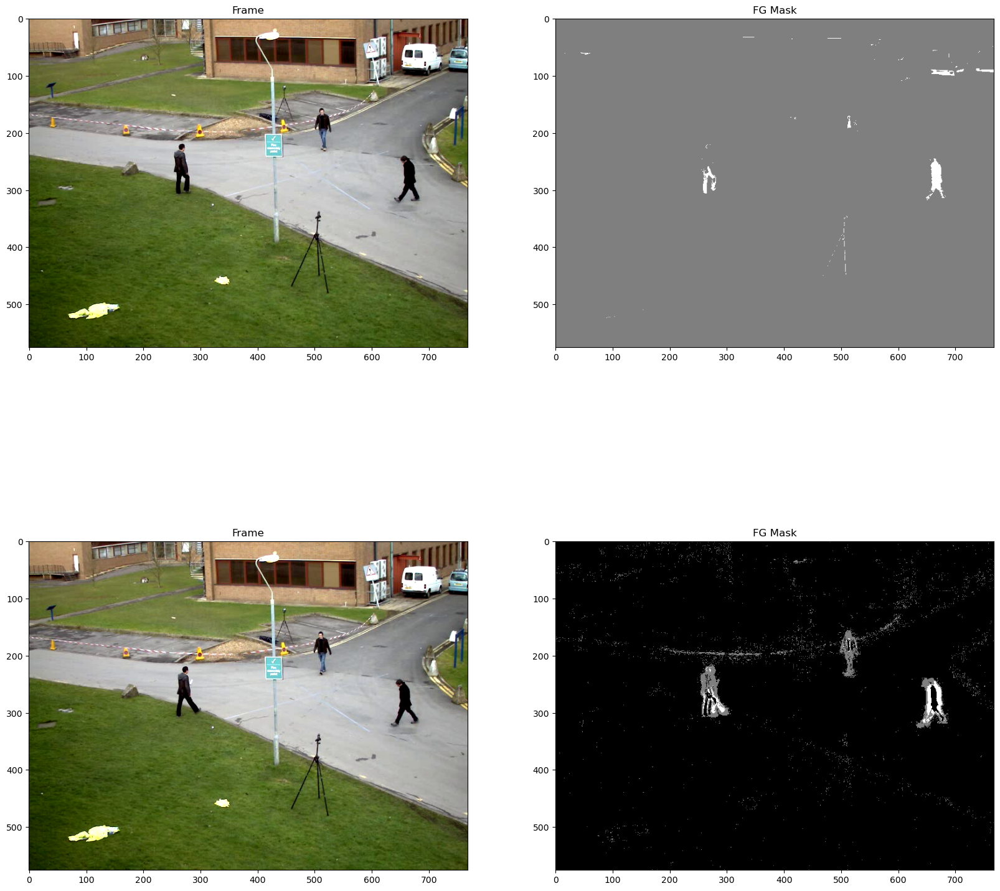

In [27]:
algo = 'MOG2'

if algo == 'MOG2':
    backSub = cv2.createBackgroundSubtractorMOG2()
else:
    backSub = cv2.createBackgroundSubtractorKNN()

plt.figure(figsize=(20, 20))

frame = cv2.imread('img/Background_Subtraction_Tutorial_frame.png')
fgMask = backSub.apply(frame)

plt.subplot(2, 2, 1)
plt.title("Frame")
plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))

plt.subplot(2, 2, 2)
plt.title("FG Mask")
plt.imshow(cv2.cvtColor(fgMask, cv2.COLOR_BGR2RGB))

frame = cv2.imread('img/Background_Subtraction_Tutorial_frame_1.png')
fgMask = backSub.apply(frame)

plt.subplot(2, 2, 3)
plt.title("Frame")
plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))

plt.subplot(2, 2, 4)
plt.title("FG Mask")
plt.imshow(cv2.cvtColor(fgMask, cv2.COLOR_BGR2RGB))

## Image scaling and resizing

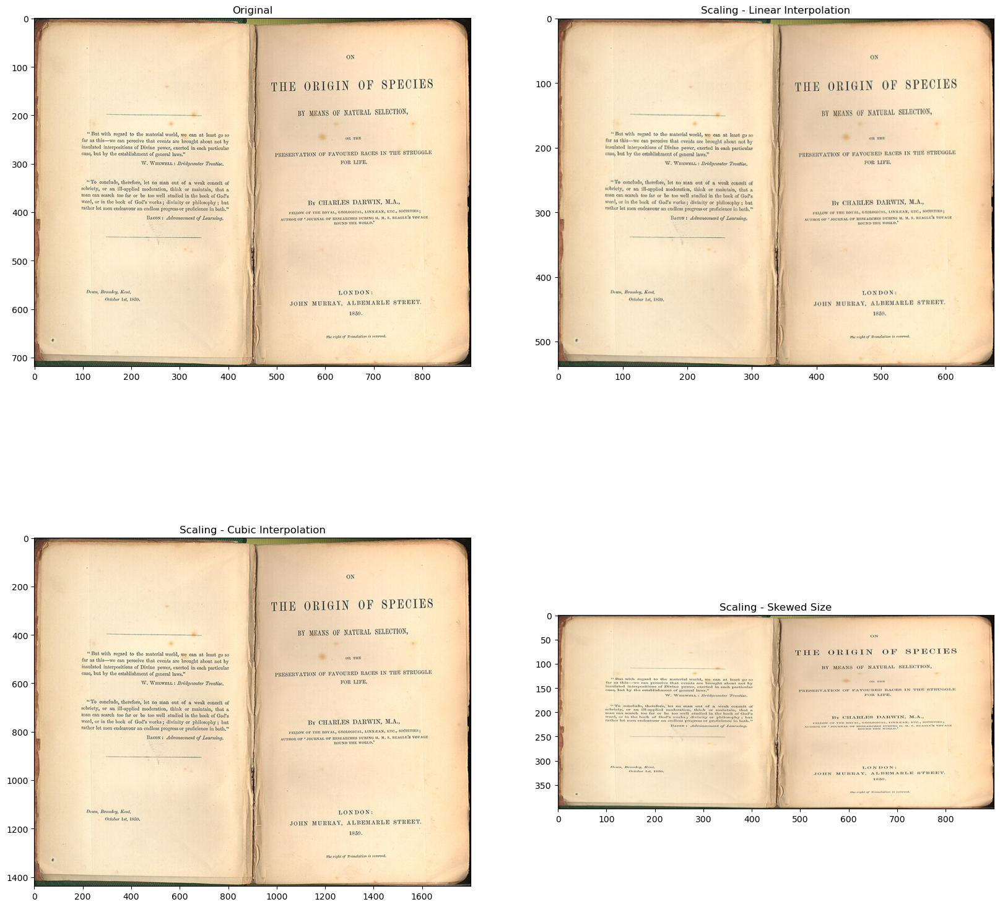

In [29]:
image = cv2.imread('img/Origin_of_Species.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20, 20))

plt.subplot(2, 2, 1)
plt.title("Original")
plt.imshow(image)

image_scaled = cv2.resize(image, None, fx=0.75, fy=0.75)

plt.subplot(2, 2, 2)
plt.title("Scaling - Linear Interpolation")
plt.imshow(image_scaled)

img_scaled = cv2.resize(image, None, fx=2, fy=2, interpolation = cv2.INTER_CUBIC)

plt.subplot(2, 2, 3)
plt.title("Scaling - Cubic Interpolation")
plt.imshow(img_scaled)

img_scaled = cv2.resize(image, (900, 400), interpolation = cv2.INTER_AREA)

plt.subplot(2, 2, 4)
plt.title("Scaling - Skewed Size")
plt.imshow(img_scaled)